## Исследование рынка заведений общественного питания Москвы

Заказчик этого исследования — Инвесторы из фонда «Shut Up and Take My Money».

В данном исследовании будет проведен анализ рынка заведений общественного питания Москвы с целью выявления особенностей данного рынка, которые в будущем помогут в выборе подходящего места для открытия заведения.

Исследование состоит из нескольких этапов:

- предобработка данных;

- анализ исходных данных;

- анализ открытия кофейни.

## Загружаем данные и изучаем общую информацию

In [1]:
# импортируем библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
import plotly.express as px 
import warnings
warnings.filterwarnings('ignore')

In [2]:
# открываем файл
try:
    data = pd.read_csv('C:/Users/Student/Desktop/dataset.csv')
except:
    data = pd.read_csv('/datasets/moscow_places.csv')

data.head(15)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [3]:
# выводим информацию о датафрейме
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Всего в датафрейме 8406 строк, в 6 столбцах есть пропуски. 

Посмотрим числовые значения для столбцов.

In [4]:
# смотрим сводную статистику для числовых столбцов
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


Можно предположить, что есть аномальные значения. В частности необходимо проверить колонки "middle_avg_bill", "middle_coffee_cup" и "seats". В этих колонках есть значения, равные нулю и слишком высокие значения.

## Выполняем предобработку данных

### Проверяем типы данных

In [5]:
# выводим информацию о датафрейме
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Типы данных корректны, за исключением столбца "seats", здесь можно было бы изменить тип данных на целочисленный, но поскольку в этом столбце есть пропуски, то сделать это не представляется возможным.

### Изучаем пропуски в датафрейме

Изучим пропуски в датафрейме.

In [6]:
# считаем количество пропусков в столбцах
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Заполнить пропущенные значения в столбцах "hours", "price", "avg_bill" и "seats" не представляется возможным. Посмотрим долю пропусков в столбцах. Если доля будет составлять менее 5%, то удалим строки с пропущенными значениями.

In [7]:
# считаем долю пропусков
pd.DataFrame(round(data.isna().mean().sort_values(ascending=False)*100,1)).style.background_gradient('coolwarm')

,0
middle_coffee_cup,93.600000
middle_avg_bill,62.500000
price,60.600000
avg_bill,54.600000
seats,43.000000
hours,6.400000
name,0.000000
category,0.000000
address,0.000000
district,0.000000


Пропусков много и удалить их не будем, но заменим пропущенные значения на "не определен".

In [8]:
# заполняем пропуски
for column in ['hours', 'price', 'avg_bill']:
    data[column] = data[column].fillna('не определен')

Пропуски в столбце "seats" оставим как есть.

### Изучаем дубликаты в датафрейме

Для начала необходимо проверить датафрейм на наличие явных дубликатов.

In [9]:
# проверяем датафрейм на наличие явных дубликатов
print('\nЧисло дубликатов:', data.duplicated().sum())


Число дубликатов: 0


Изучим столбцы с категориальными данными на наличие дубликатов.

In [10]:
# выводим уникальные значения для столбца category
data['category'].sort_values().unique()

array(['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня',
       'пиццерия', 'ресторан', 'столовая'], dtype=object)

Неявных дубликатов нет.

In [11]:
# выводим уникальные значения для столбца district
data['district'].sort_values().unique()

array(['Восточный административный округ',
       'Западный административный округ',
       'Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Центральный административный округ',
       'Юго-Восточный административный округ',
       'Юго-Западный административный округ',
       'Южный административный округ'], dtype=object)

Неявных дубликатов нет.

In [12]:
# выводим уникальные значения для столбца price
data['price'].sort_values().unique()

array(['высокие', 'выше среднего', 'не определен', 'низкие', 'средние'],
      dtype=object)

Неявных дубликатов нет.

In [13]:
# считаем дубликаты в столбце avg_bill
print('\nЧисло дубликатов:',data['avg_bill'].duplicated().sum())


Число дубликатов: 7508


Приведем столбец к нижнему регистру для того, чтобы устранить неявные дубликаты в случае их появления из-за записи значений в разных регистрах.

In [14]:
# приводим столбец avg_bill к нижнему регистру
data['avg_bill'] = data['avg_bill'].astype(str).str.lower()

In [15]:
# еще раз считаем количество дубликатов в столбце avg_bill
print('\nЧисло дубликатов:',data['avg_bill'].duplicated().sum())


Число дубликатов: 7508


Неявных дубликатов нет.

### Проверяем количественные значения

В начале исследования было выявлено, что в столбцах с количественными значениями, присутствуют выбросы. Построим диаграмму размаха для каждого из столбцов, чтобы исключить такие значения.

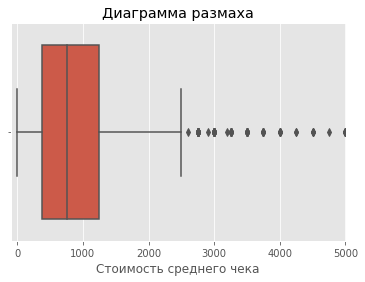

In [16]:
# строим диаграмму размаха для столбца middle_avg_bill
plt.style.use('ggplot')
sns.boxplot(data['middle_avg_bill'])
plt.title('Диаграмма размаха')
plt.xlabel('Стоимость среднего чека')
plt.xlim(-100, 5000)
plt.show()

Есть значения, равные нулю. Посмотрим на эти строки.

In [17]:
# выводим сттроки со значениями в столбце middle_avg_bill, равными нулю
data[data['middle_avg_bill'] == 0]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3688,Кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,высокие,средний счёт:от 0 ₽,0.0,NaN,1,200.0


Такая строка всего одна. В столбце "avg_bill" также указан ноль, так что корректно заполнить столбец "middle_avg_bill" в этой строке не получится. Таким образом нормальные значения для столбца "middle_avg_bill" находятся в пределах от 0 до 2500 рублей.

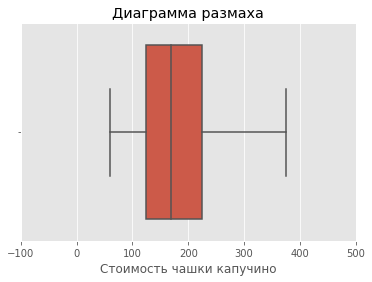

In [18]:
# строим диаграмму размаха для столбца middle_coffee_cup
sns.boxplot(data['middle_coffee_cup'])
plt.title('Диаграмма размаха')
plt.xlabel('Стоимость чашки капучино')
plt.xlim(-100, 500)
plt.show()

Нормальные значения для столбца "middle_coffee_cup" находятся в пределах от 60 до 370 рублей.

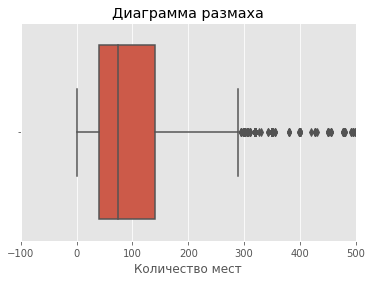

In [19]:
# строим диаграмму размаха для столбца seats
sns.boxplot(data['seats'])
plt.title('Диаграмма размаха')
plt.xlabel('Количество мест')
plt.xlim(-100, 500)
plt.show()

Нормальные значения для столбца "seats" находятся в пределах от 0 до 290.

### Добавляем новые столбцы

Создадим столбец "street" с названиями улиц из столбца с адресом.

In [20]:
# создаем столбец с названием улицы
data['street'] = data['address'].str.split(', ').str[1]

In [21]:
# проверяем наличие нового столбца
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,не определен,не определен,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,не определен,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


Создадим столбец "is_24/7" с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

In [22]:
# создаем столбец с указанием ежедневной круглосуточной работы
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

In [23]:
# проверяем наличие нового столбца
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,не определен,не определен,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,не определен,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


## Анализ данных

Исследуем какие категории заведений представлены в данных. Посчитаем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.

In [24]:
# создаем сводную таблицу по категориям заведений
data_category = data.groupby('category', as_index=False)['address'].agg('count')
data_category.columns = ['category','count']
data_category.sort_values('count', ascending=False)

,category,count
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


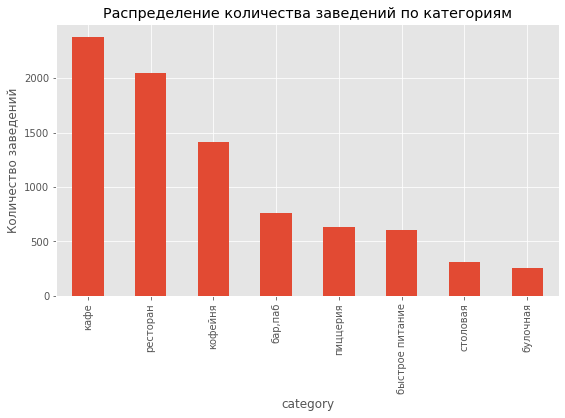

In [25]:
# создаем график, отображающий распределение заведений по категориям
(data_category.sort_values(by='count', ascending=False)
    .plot(kind='bar', figsize=(9, 5), x='category', y='count', title='Распределение количества заведений по категориям', 
          legend = False))
plt.ylabel('Количество заведений')
plt.show()

Самое большое количество заведений в категориях "кафе" и "ресторан". Третья по количеству заведений - категория "кофейня". Меньше всего заведений в категориях "столовая" и "булочная".

Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Также рассчитаем среднюю и медианную величину мест в каждой категории заведений.

In [26]:
# создаем сводную таблицу по количеству посадочных мест по категориям заведений
data_seats = data.pivot_table(index='category',values='seats',aggfunc=['sum', 'mean', 'median'])
data_seats.columns = ['sum', 'mean', 'median']
data_seats['mean'] = round(data_seats['mean'], 2)
data_seats.sort_values('median', ascending=False)

,sum,mean,median
category,,,
ресторан,154869.0,121.94,86.0
"бар,паб",58281.0,124.53,82.5
кофейня,83511.0,111.20,80.0
столовая,16359.0,99.75,75.5
быстрое питание,34513.0,98.89,65.0
кафе,118770.0,97.51,60.0
пиццерия,40350.0,94.50,55.0
булочная,13229.0,89.39,50.0


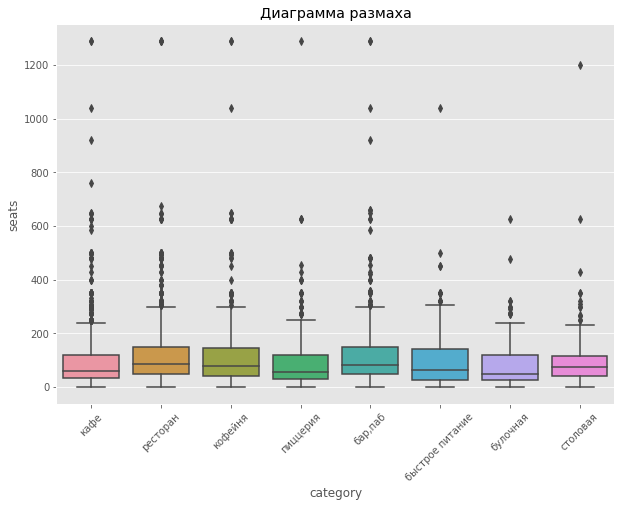

In [27]:
# создадим диаграмму размаха по количеству мест для каждой категории заведений
plt.figure(figsize=(10, 7))
sns.boxplot(x='category', y='seats', data=data) 
plt.xticks(rotation=45)
plt.title('Диаграмма размаха')
plt.show()

Самое большое медианное значение количества посадочных мест в категориях "ресторан", "бар,паб", "кофейня". Минимальное значение приходится на категорию "булочная".

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

In [28]:
# создаем сводную таблицу по соотношению сетевых и несетевых заведений
data_chain = data.groupby('chain', as_index=False)['address'].agg('count')
data_chain.columns = ['chain','count']
data_chain['share'] = (data_chain['count']/len(data)*100).round().astype('int')
data_chain.sort_values(by='share', ascending=False)

,chain,count,share
0,0,5201,62
1,1,3205,38


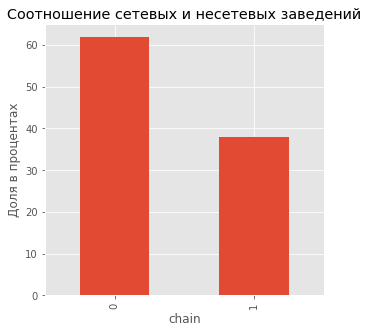

In [29]:
# создаем график, отображающий соотношение сетевых и несетевых заведений
(data_chain.sort_values(by='share', ascending=False)
    .plot(kind='bar', figsize=(5, 5), x='chain', y='share', title='Соотношение сетевых и несетевых заведений', 
          legend = False))
plt.ylabel('Доля в процентах')
plt.show()

Несетевых заведений 5201, что составляет 62% от общего количества заведений. Сетевых - 3205, что составляет 38%.

Рассмотрим какие категории заведений чаще являются сетевыми.

In [30]:
# создаем сводную таблицу, отображающую долю сетевых заведений в категории от общего числа заведений
df_chain_share = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count')
df_chain_share.columns = ['not_chain', 'chain']
df_chain_share['total'] = df_chain_share['not_chain'] + df_chain_share['chain']
df_chain_share['share'] = (df_chain_share['chain']/df_chain_share['total']*100).round().astype('int')
df_chain_share.sort_values(by='share', ascending=False)

,not_chain,chain,total,share
category,,,,
булочная,99,157,256,61
пиццерия,303,330,633,52
кофейня,693,720,1413,51
быстрое питание,371,232,603,38
ресторан,1313,730,2043,36
кафе,1599,779,2378,33
столовая,227,88,315,28
"бар,паб",596,169,765,22


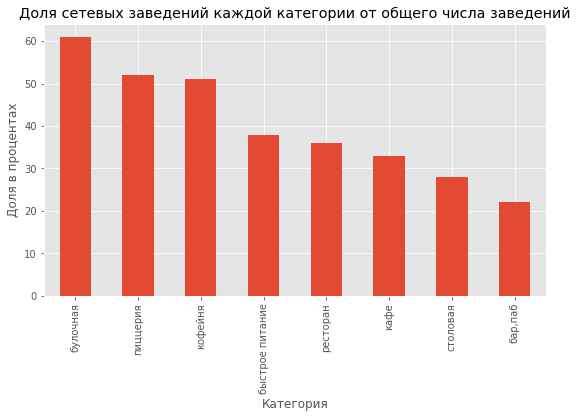

In [31]:
# строим график, отображающий долю сетевых заведений в категории от общего числа заведений
(df_chain_share.sort_values('share', ascending=False)
    .plot(kind='bar', grid=True, figsize=(9, 5), y='share', 
          title='Доля сетевых заведений каждой категории от общего числа заведений', 
          legend = False))

plt.xlabel('Категория')
plt.ylabel('Доля в процентах')
plt.show()

Самое большое количество сетевых заведений в категории "булочная" (61 % от общего количества заведений). Наименьшую долю сетевых заведений имеет категория "бар, паб" - 22%.

Найдем топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. 

In [32]:
# выбираем сетевые заведения из всего датафрейма
chain_places = data[data['chain'] == 1]
# создаем сводную таблицу из 15-ти самых популярных сетей в Москве
data_name = chain_places.pivot_table(index='name',values='address',aggfunc='count')
data_name.columns = ['count']
top_name = data_name.sort_values('count', ascending=False).head(15)
top_name

,count
name,
Шоколадница,120
Домино'с Пицца,76
Додо Пицца,74
One Price Coffee,71
Яндекс Лавка,69
Cofix,65
Prime,50
Хинкальная,44
КОФЕПОРТ,42


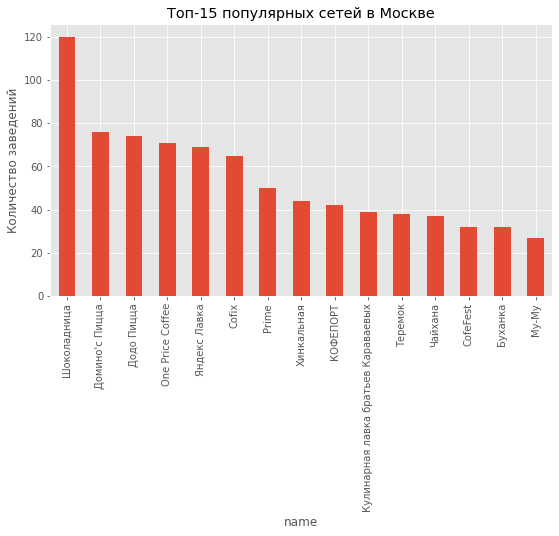

In [33]:
# создаем график соотношения количества заведений в 15-ти самых популярных сетях Москвы
(top_name.sort_values(by='count', ascending=False)
    .plot(kind='bar', figsize=(9, 5), y='count', title='Топ-15 популярных сетей в Москве', 
          legend = False))
plt.ylabel('Количество заведений')
plt.show()

Больше всего заведений в сети "Шоколадница" (120 заведений). Далее идут заведения "Домино'с Пицца" и "Додо Пицца" (76 и 74 соответственно). Меньше всего заведений в сети "Му-Му" (27 заведений).

Посмотрим к каким категориям заведений относятся топ-15 популярных сетей в Москве.

In [34]:
# создаем сводную таблицу по категориям заведений среди топ-15 популярных сетей в Москве
top_name = top_name.index
pd.DataFrame(chain_places.query('name in @top_name').groupby('name')['category'].unique())

,category
name,
CofeFest,"[кофейня, кафе]"
Cofix,[кофейня]
One Price Coffee,[кофейня]
Prime,"[ресторан, кафе]"
Буханка,"[булочная, кофейня, кафе]"
Додо Пицца,[пиццерия]
Домино'с Пицца,[пиццерия]
КОФЕПОРТ,[кофейня]
Кулинарная лавка братьев Караваевых,[кафе]


In [35]:
# создаем сводную таблицу по количеству заведений по категориям среди топ-15 популярных сетей в Москве
top_name_category = pd.DataFrame(chain_places.query('name in @top_name').groupby('category')['name'].count())
top_name_category.columns = ['count']
top_name_category.sort_values('count', ascending=False)

,count
category,
кофейня,336
ресторан,186
пиццерия,151
кафе,100
булочная,25
быстрое питание,12
"бар,паб",4
столовая,2


In [36]:
# создаем круговую диаграмму по количеству заведений по категориям среди топ-15 популярных сетей в Москве
fig = go.Figure(data=[go.Pie(labels=top_name_category.index, values=top_name_category['count'])])
fig.update_layout(title='Распределение количества заведений по категориям среди топ-15 популярных сетей в Москве')  
fig.show()

Самая распространенная категория среди топ-15 популярных сетей в Москве "кофейня" - 41.2%. Далее популярными категориями являются "ресторан", "пиццерия" и "кафе" (22.8%, 18.5% и 12.3% соответственно). Наимее популярными категориями являются "быстрое питание", "бар,паб" и "столовая" (1.52%, 0.506% и 0.253%).

Рассмотрим какие административные округа Москвы присутствуют в датасете. И отобразим общее количество заведений и количество заведений каждой категории по округам. 

In [37]:
# создаем сводную таблицу по количеству заведений по административным округам Москвы
data_district_count = data.groupby('district', as_index=False)['address'].agg('count')
data_district_count.columns = ['district','count']
data_district_count.sort_values('count', ascending=False)

,district,count
5,Центральный административный округ,2242
2,Северный административный округ,900
8,Южный административный округ,892
3,Северо-Восточный административный округ,891
1,Западный административный округ,851
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


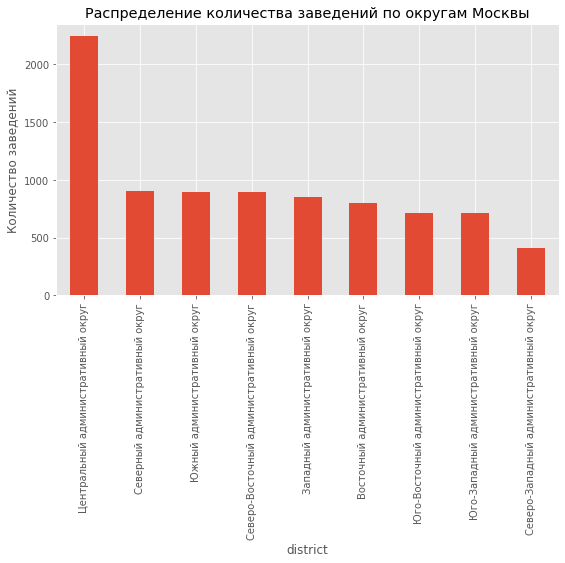

In [38]:
# создаем график, отображающий распределение количества заведений по округам Москвы
(data_district_count.sort_values(by='count', ascending=False)
    .plot(kind='bar', figsize=(9, 5), x='district', y='count', title='Распределение количества заведений по округам Москвы', 
          legend = False))
plt.ylabel('Количество заведений')
plt.show()

Больше всего заведений в Центральном административном округе - 2242 заведения. Наименьшее количество заведений в Северо-Западном округе - 409 заведений. В остальных округах количество заведений варьируется от 709 до 900. Рассмотрим распределение категорий заведений по округам Москвы.

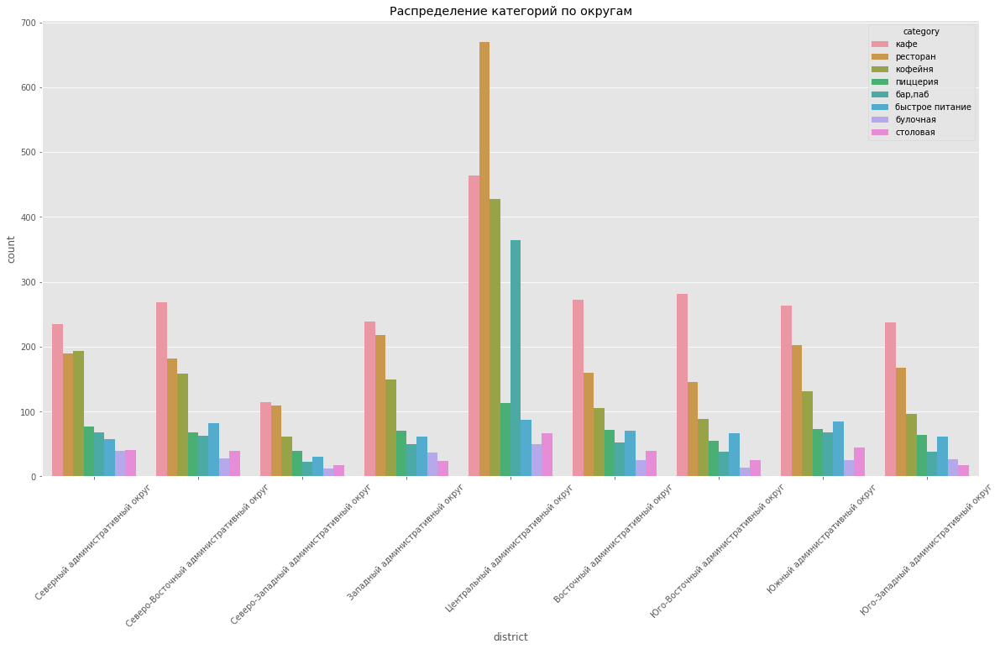

In [39]:
# создаем график распределения заведений по категориям и по округам Москвы
plt.figure(figsize=(20, 10))
sns.countplot(x='district', hue='category', data=data)
plt.xticks(rotation=45)
plt.title('Распределение категорий по округам')
plt.show()

Итак, в Центральном округе больше всего ресторанов. Также в этом округе большое количество заведений категории "бар,паб" по сравнению с другими округами. В остальных округах чаще встречаются кафе.

Рассмотрим распределение средних рейтингов по категориям заведений.

In [40]:
# создаем сводную таблицу по среднему рейтингу категорий заведений
data_rating = data.pivot_table(index='category',values='rating',aggfunc='mean')
data_rating.columns = ['mean']
data_rating['mean'] = round(data_rating['mean'], 2)
data_rating.sort_values('mean', ascending=False)

,mean
category,
"бар,паб",4.39
пиццерия,4.30
ресторан,4.29
кофейня,4.28
булочная,4.27
столовая,4.21
кафе,4.12
быстрое питание,4.05


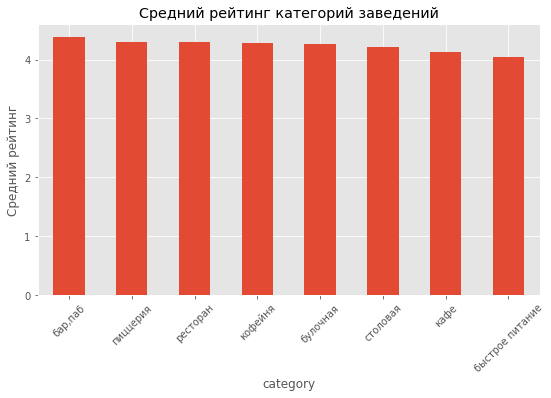

In [41]:
# создаем график распределения среднего рейтинга по категориям заведений
(data_rating.sort_values(by='mean', ascending=False)
    .plot(kind='bar', figsize=(9, 5), y='mean', title='Средний рейтинг категорий заведений', 
          legend = False))
plt.xticks(rotation=45)
plt.ylabel('Средний рейтинг')
plt.show()

Самый высокий средний рейтинг у категории "бар,паб" - 4.39. Наименьший рейтинг у заведений быстрого питания - 4.05.

Рассмотрим значения среднего рейтинга заведений в зависимости от административного округа Москвы.

In [42]:
# создаем сводную таблицу по среднему рейтингу заведений в зависимости от округа
data_district_rating = data.groupby('district', as_index=False)['rating'].agg('median')
data_district_rating

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого округа. 

In [43]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
map_1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(map_1)

# выводим карту
map_1

Средние рейтинги заведений в зависимости от округа варьируются от 4.2 до 4.4. Самый высокий рейтинг в Центральном округе. Самые низкие рейтинги в Северо-Восточном и Юго-Восточном округах.

Отобразим все заведения датасета на карте с помощью кластеров.

In [44]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
map_2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(map_2)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
map_2

Найдем топ-15 улиц по количеству заведений.

In [45]:
# создаем сводную таблицу по количеству заведений по улицам
data_street = data.pivot_table(index='street',values='address',aggfunc='count')
data_street.columns = ['count']
# выбираем топ-15 улиц с наибольшим количеством заведений
top_street = data_street.sort_values('count', ascending=False).head(15)
top_street

,count
street,
проспект Мира,184
Профсоюзная улица,122
проспект Вернадского,108
Ленинский проспект,107
Ленинградский проспект,95
Дмитровское шоссе,88
Каширское шоссе,77
Варшавское шоссе,76
Ленинградское шоссе,70


Построим график распределения количества заведений и их категорий по этим улицам.

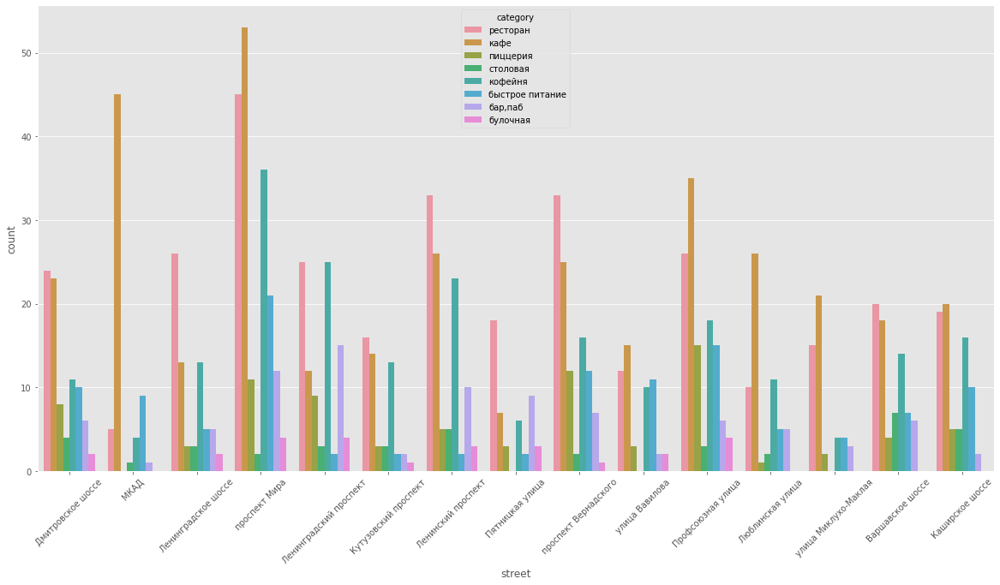

In [46]:
# строим график распределения категорий заведений по улицам с наибольшим количеством заведений
top_street = top_street.index
top_street_data = data.query('street in @top_street')
plt.figure(figsize=(20, 10))
sns.countplot(x='street', hue='category', data=top_street_data)
plt.xticks(rotation=45)
plt.show()

Самыми распространенными категориями заведений на этих улицах являются рестораны и кафе.

Найдем улицы, на которых находится только один объект общепита.

In [47]:
# отфильтруем сводную таблицу по количеству заведений на улице, равному 1
street_1 = data_street[data_street['count'] == 1]
street_1.head(15)

,count
street,
1-й Автозаводский проезд,1
1-й Балтийский переулок,1
1-й Варшавский проезд,1
1-й Вешняковский проезд,1
1-й Голутвинский переулок,1
1-й Грайвороновский проезд,1
1-й Дербеневский переулок,1
1-й Земельный переулок,1
1-й Капотнинский проезд,1


Рассмотрим к каким категориям относятся эти заведения.

In [48]:
# создаем список из улиц с одним заведением
street_1 = street_1.index

In [49]:
# создаем сводную таблицу по количеству заведений в категориях 
data_street_1 = data.query('street in @street_1')
data_street_1_count_rating = data_street_1.pivot_table(index='category',values='rating',aggfunc=['count'])
data_street_1_count_rating.columns = ['count']
data_street_1_count_rating.sort_values('count', ascending=False)

,count
category,
кафе,160
ресторан,93
кофейня,84
"бар,паб",39
столовая,36
быстрое питание,23
пиццерия,15
булочная,8


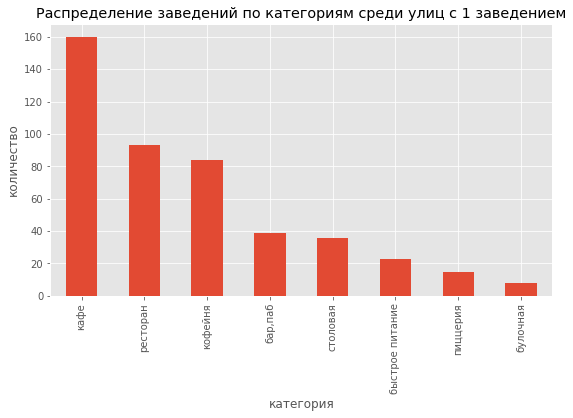

In [50]:
# создаем график распределения заведений по категориям
(data_street_1_count_rating.sort_values(by='count', ascending=False)
    .plot(kind='bar', figsize=(9, 5), y='count', title='Распределение заведений по категориям среди улиц с 1 заведением', 
          legend = False))

plt.xlabel('категория')
plt.ylabel('количество')
plt.show()

Самой распространенной категорией на улицах с 1 заведением является "кафе".

In [51]:
# считаем улицы с одним заведением
print('Всего улиц с одним заведением:', len(street_1))

Всего улиц с одним заведением: 458


Укажем эти заведения на карте.

In [52]:
# создаём карту Москвы
map_3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(map_3)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}, {row['rating']}, {row['category']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_street_1.apply(create_clusters, axis=1)

# выводим карту
map_3

Рассмотрим медианные значения средних чеков заведений для каждого округа Москвы.

In [53]:
# создаем сводную таблицу по значениям среднего чека заведений по округам Москвы
data_district_bill = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
data_district_bill.sort_values('middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


Построим фоновую картограмму (хороплет) со средним значением чека для каждого округа.

In [54]:
# создаём карту Москвы
map_4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_district_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.8,
    legend_name='Среднее значение чека',
).add_to(map_4)

# выводим карту
map_4

Самый высокий средний чек в Центральном и Западном округах Москвы (1000 рублей). Далее идут Северо-Западный и Северный округа (от 633 до 725 рублей). За ними Юго-Западный и Восточный округа (от 542 до 633 рублей). Северо-Восточный, Южный и Юго-Восточный округа имеют самый низкий средний чек (от 450 до 542 рублей).

Самыми распространенными категориями заведений в Москве являются: кафе, ресторан и кофейня. Меньше всего заведений в категориях "столовая" и "булочная".

Самое большое количество посадочных мест соответствует категориям "ресторан", "бар,паб" и "кофейня" - от 80 до 86 мест.

В Москве несетевых заведений - 5201, сетевых - 3205. При этом, если сравнивать соотношение сетевых заведений в одной категории от общего числа сетевых заведений, то самое большое количество сетевых заведений в категории "булочная" (61 % от общего количества заведений). Самыми популярными сетевыми заведениями являются "Шоколадница", "Домино'с Пицца" и "Додо Пицца". Самая распространенная категория среди популярных сетей в Москве "кофейня" - 41.2%. 

Больше всего заведений в Центральном административном округе. При этом в зависимости от округа меняется преобладание той или иной категории заведений. Так, в Центральном округе больше всего ресторанов. Также в этом округе большое количество заведений категории "бар,паб" по сравнению с другими округами. В остальных округах чаще встречаются кафе.

Самые высокие рейтинги заведений в Центральном округе. Самые низкие рейтинги в Северо-Восточном и Юго-Восточном округах. 

Самый высокий средний чек в Центральном и Западном округах Москвы.

## Детализируем исследование: открытие кофейни

Рассмотрим кофейни в Москве, их количество и особенности расположения. 

In [55]:
# считаем количество кофеен
coffee_data = data[data['category'] == 'кофейня']
print('Всего кофеен:', len(coffee_data))

Всего кофеен: 1413


In [56]:
# создаем сводную таблицу по распределению кофеен по округам Москвы
coffee_data_count = coffee_data.groupby('district', as_index=False)['address'].agg('count')
coffee_data_count.columns = ['district','count']
coffee_data_count.sort_values('count', ascending=False)

,district,count
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [57]:
# строим круговую диаграмму по распределению кофеен по округам
fig = go.Figure(data=[go.Pie(labels=coffee_data_count['district'], values=coffee_data_count['count'])])
fig.update_layout(title='Распределение кофеен по округам Москвы')  
fig.show()

Больше всего кофеен в Центральном округе города Москвы, меньше всего в Северо-Западном округе.

Есть ли круглосуточные кофейни?

In [58]:
# считаем количество круглосуточных кофеен
print('Всего круглосуточных кофеен:', len(coffee_data[coffee_data['is_24/7'] == True]))

Всего круглосуточных кофеен: 59


In [59]:
# выбираем круглосуточные кофейни
coffee_data_is_24 = coffee_data[coffee_data['is_24/7'] == True]

In [60]:
# создаем сводную таблицу с распределением круглосуточных кофеен по округам Москвы
coffee_data_is_24_count = coffee_data_is_24.groupby('district', as_index=False)['address'].agg('count')
coffee_data_is_24_count.columns = ['district','count']
coffee_data_is_24_count.sort_values('count', ascending=False)

,district,count
5,Центральный административный округ,26
1,Западный административный округ,9
7,Юго-Западный административный округ,7
0,Восточный административный округ,5
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


Построим фоновую картограмму (хороплет) распределения круглосуточных кофеен по округам Москвы.

In [61]:
# создаём карту Москвы
map_5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_data_is_24_count,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.8,
    legend_name='Распределение круглосуточных кофеен',
).add_to(map_5)

# выводим карту
map_5

Больше всего круглосуточных кофеен в Центральном округе (26 заведений). Далее идут Западный и Юго-Западный округа (9 и 7 заведений соответственно). В остальных округах от 1 до 5 заведений.

Какие у кофеен рейтинги? Как они распределяются по районам?

In [62]:
# создаем сводную таблицу по среднему рейтингу кофеен по округам
coffee_data_rating = coffee_data.groupby('district', as_index=False)['rating'].agg('mean')
coffee_data_rating['rating'] = round(coffee_data_rating['rating'], 2)
coffee_data_rating.sort_values('rating', ascending=False)

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


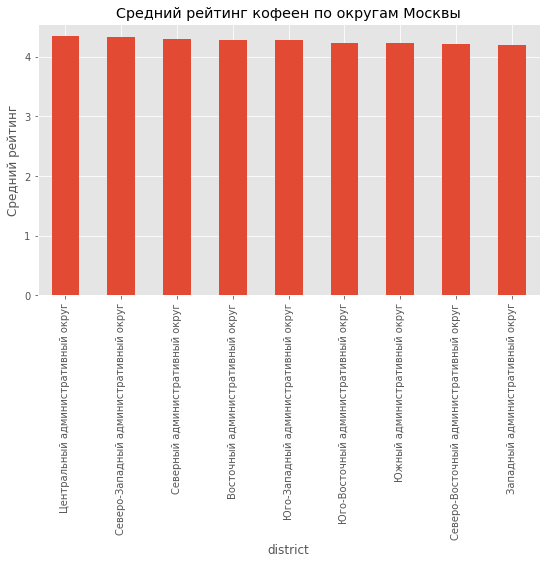

In [63]:
# создаем график распределения среднего рейтинга кофеен по округам Москвы
(coffee_data_rating.sort_values(by='rating', ascending=False)
    .plot(kind='bar', figsize=(9, 5), x='district', y='rating', title='Средний рейтинг кофеен по округам Москвы', 
          legend = False))
plt.ylabel('Средний рейтинг')
plt.show()

Как видно из графика средний рейтинг кофеен слабо зависит от округа Москвы.

Рассмотрим среднюю стоимость чашки капучино.

In [64]:
# создаем сводную таблицу средней стоимости чашки капучино по округам Москвы
coffee_data_cup = coffee_data.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')
coffee_data_cup.sort_values('middle_coffee_cup', ascending=False)

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


Построим фоновую картограмму (хороплет) распределения средней стоимости чашки капучино по округам Москвы.

In [65]:
# создаём карту Москвы
map_6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_data_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки капучино',
).add_to(map_6)

# выводим карту
map_6

Самая высокая средняя стоимость чашки капучино в Центральном, Юго-Западном и Западном округах Москвы (от 188 до 198 рублей). Самая низкая стоимость в Восточном округе - 135 рублей.

## Вывод

Несмотря на большое количество кофеен в центральном округе, в этом округе есть улицы, на которых расположено только одно заведение общепита. Если планируется открытие одной, но знаковой кофейни, лучше всего выбирать центральный округ. Кроме того категория "кофейни" является не самой многочисленной для Центрального округа, в основном в этом округе расположены рестораны.

Если планируется открытие круглосуточной кофейни, то также следует рассмотреть Центральный округ.

При открытии сети кофеен можно рассмотреть отдаленные от центра районы. Например в Северо-Западном округе минимальное количество кофеен - 62 заведения, тогда как в Центральном округе их насчитывается 428.

Средний рейтинг кофеен довольно высокий 4.3 и не зависит от округа расположения.

Средняя стоимость чашки капучино зависит от расположения заведения. Самая высокая стоимость в Центральном, Юго-Западном и Западном округах Москвы (от 188 до 198 рублей). В остальных округах стоимость варьируется от 135 до 188 рублей.

Презентация:
https://disk.yandex.ru/i/xNxLEqQe1vMImA